## Trigger Word Detection 
 
Keyword detection is used by many famous modern technologies like Amazon Alexa and Apple Siri.
We want the device to start listening when we say a specific keyword, in our case the keyword is "activate".

We will train a model that should recognise and react whenever we say the keyword. 
We will be adding a "chime" sound whenever a keyword is recognized.

In [2]:
import numpy as np
from pydub import AudioSegment
import IPython
from utils import *
%matplotlib inline

## Creating a Speech Dataset from sound to images 

### Transforming Sound to Images: Spectogram

To transform a sound clip to an image we will make a spectogram using the Fourier transform.<br>
This allows us to create an image where the y-axis represents the frequency of the sound and the x-axis represents to time.<br> How 'active' a certain frequency is at a given time is represented by the color: green is more active, blue is less active. <br>
This allows us to represent the frequency and activation (or 'loudness') of an audio sample in one image.

Each audio segment is sampled at 44,100 Hertz, meaning that each second is subdivided in 44,100 sections. <br>
This means that for a 10 second clip we will have 441,000 sections, this is way too much. <br>
We will downsample these audio clips to 5511 sections for each 10 second clip, which will make it easier to train the model.<br>
You'll see later that the spectrogram will be the input $x$ into the network, and so $T_x = 5511$. <br>

### The Dataset

In the 'raw_data' folder we find the 'activates', 'background' and 'negatives' subfolders. <br>
The "activate" directory contains positive examples of the keyword "activate". <br>
The "negatives" directory contains negative examples, each example is one word.<br>
The "backgrounds" directory contains 10 second clips of background noise in different environments.<br>

We will create a dataset based on these 3 types of recordings.<br>
The big idea is to overlay positive and negative examples on top of one of the 10 second background recordings.<br>
We will achieve this by using the 'pydub' library, this will allow us to play with the volumes of the different recording to make a good dataset to train on, while making sure that all the entries of the dataset are exactly 10 seconds long.

In [3]:
# Training example
IPython.display.Audio("audio_examples/example_train.wav")

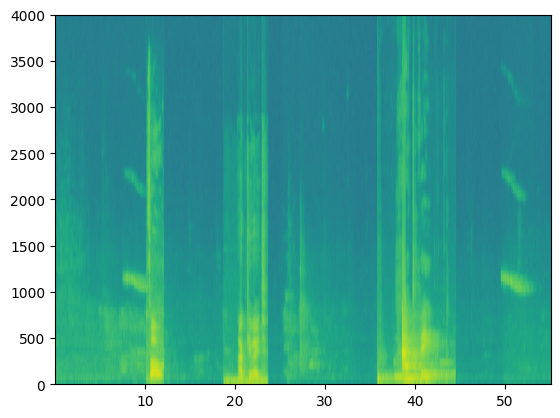

In [4]:
x = graph_spectrogram("audio_examples/example_train.wav")

The graph_spectrogram() function returns a (101, 5511) matrix. <br>
So, we can confirm:

In [5]:
Tx = 5511 # The number of time steps input to the model from the spectrogram
n_freq = 101 # Number of frequencies input to the model at each time step of the spectrogram

#### Dividing into time-intervals
Note that we may divide a 10 second interval of time with different units (steps).
* Raw audio divides 10 seconds into 441,000 units.
* A spectrogram divides 10 seconds into 5,511 units.
    * $T_x = 5511$
* You will use a Python module `pydub` to synthesize audio, and it divides 10 seconds into 10,000 units.
* The output of our model will divide 10 seconds into 1,375 units.
    * $T_y = 1375$
    * For each of the 1375 time steps, the model predicts whether someone recently finished saying the trigger word "activate". 
* All of these are hyperparameters and can be changed (except the 441000, which is a function of the microphone). 
* We have chosen values that are within the standard range used for speech systems.

In [6]:
Ty = 1375 # The number of time steps in the output of our model

### Generating a Single Training Example

#### Pydub
* We will use the pydub package to manipulate audio. 
* Pydub converts raw audio files into lists of Pydub data structures.
* Pydub uses 1ms as the discretization interval (1 ms is 1 millisecond = 1/1000 seconds).
    * This is why a 10 second clip is always represented using 10,000 steps. 

In [7]:
# Load audio segments using pydub 
activates, negatives, backgrounds = load_raw_audio('./raw_data/')

#### Label the positive/negative words

Because we syntesised the data ourselves by creating the data entries from scratch, it's easier to label the data as well. <br>
As I've mentioned before, the output $T_y$ is 1375, meaning we will need an output for each of these 1375 segments of the 10 second audio. These segments are called $y^{\langle t \rangle}$. <br>
* Initially these will all be set to 0 or False
* When we add the keyword "activates" we will set the next 50 segments $y^{\langle t \rangle}$ to 1 or True.
This will create a more balanced dataset, which will make it easier to train the model.

#### Helper functions

* All of these functions will use a 1ms discretization interval
* The 10 seconds of audio is always discretized into 10,000 steps. 


1. `get_random_time_segment(segment_ms)`
    * Retrieves a random time segment from the background audio.
2. `is_overlapping(segment_time, existing_segments)`
    * Checks if a time segment overlaps with existing segments
3. `insert_audio_clip(background, audio_clip, existing_times)`
    * Inserts an audio segment at a random time in the background audio
    * Uses the functions `get_random_time_segment` and `is_overlapping`
4. `insert_ones(y, segment_end_ms)`
    * Inserts additional 1's into the label vector y after the word "activate"

In [8]:
def get_random_time_segment(segment_ms):
    segment_start = np.random.randint(low=0, high=10000-segment_ms)  
    segment_end = segment_start + segment_ms - 1
    
    return (segment_start, segment_end)

In [9]:
def is_overlapping(segment_time, previous_segments):
    segment_start, segment_end = segment_time
    overlap = False
    
    for previous_start, previous_end in previous_segments:
        if segment_start <= previous_end and segment_end >= previous_start:
            overlap = True
            break

    return overlap

In [10]:
# Quick test 
overlap1 = is_overlapping((950, 1430), [(2000, 2550), (260, 949)])
overlap2 = is_overlapping((2305, 2950), [(824, 1532), (1900, 2305), (3424, 3656)])
print("Overlap 1 = ", overlap1)
print("Overlap 2 = ", overlap2)

Overlap 1 =  False
Overlap 2 =  True


In [11]:
def insert_audio_clip(background, audio_clip, previous_segments):   
    segment_ms = len(audio_clip)
    segment_time = get_random_time_segment(segment_ms)
    retry = 5
    while is_overlapping(segment_time, previous_segments) and retry >= 0:
        segment_time = get_random_time_segment(segment_ms)
        retry = retry - 1

    if not is_overlapping(segment_time, previous_segments):
        previous_segments.append(segment_time)
        # Overlay the audio_clip on top of the background at the position we got from 'get_random_time_segment'
        new_background = background.overlay(audio_clip, position = segment_time[0])

    else:
        # We've retried 5 times and we couldn't find a segment that doesn't overlap with the 'previous_segments'
        # 'background' remains unchanged
        new_background = background
        segment_time = (10000, 10000)
    
    return new_background, segment_time

In [12]:
# Quick test
audio_clip, segment_time = insert_audio_clip(backgrounds[0], activates[0], [(3790, 4400)])
audio_clip.export("exported_audio/insert_test.wav", format="wav")
print("Segment Time: ", segment_time)
IPython.display.Audio("exported_audio/insert_test.wav")

Segment Time:  (4683, 5403)


In [13]:
def insert_ones(y, segment_end_ms):
    #  y == numpy array of shape (1, Ty), the labels of the training example
    _, Ty = y.shape
    
    # convert time steps from ms to the fraction of Ty (= 1375).
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
    
    if segment_end_y < Ty:
        for i in range(segment_end_y+1, segment_end_y+51):
            if i < Ty:
                y[0, i] = 1
    
    return y

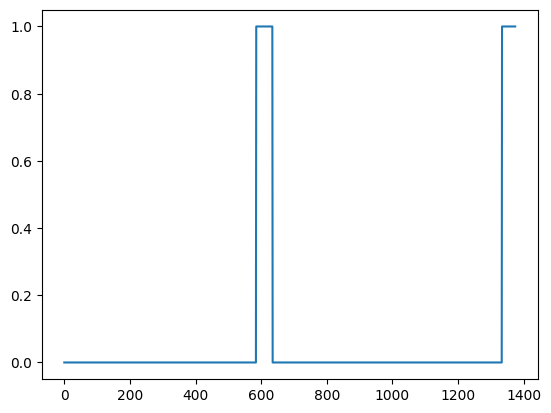

In [14]:
# Quick test
insert_x = insert_ones(np.zeros((1, Ty)), 9700)
plt.plot(insert_ones(insert_x, 4251)[0,:])

In [15]:
def create_training_example(background, activates, negatives, Ty):
    
    # Make background quieter
    #background = background - 20

    y = np.zeros((1, Ty))
    previous_segments = []
    
    # Select 0-4 random "activate" audio clips 
    number_of_activates = np.random.randint(0, 5)
    random_indices = np.random.randint(len(activates), size=number_of_activates)
    random_activates = [activates[i] for i in random_indices]
    
    for random_activate in random_activates: 
        background, segment_time = insert_audio_clip(background, random_activate, previous_segments)
        # Retrieve segment_start and segment_end from segment_time
        segment_start, segment_end = segment_time
        # Insert labels in "y" at segment_end
        y = insert_ones(y, segment_end)

    # Select random negatives audio recordings 
    number_of_negatives = np.random.randint(0, 3)
    random_indices = np.random.randint(len(negatives), size=number_of_negatives)
    random_negatives = [negatives[i] for i in random_indices]

    for random_negative in random_negatives:
        background, _ = insert_audio_clip(background, random_negative, previous_segments)
    
    background = match_target_amplitude(background, -20.0)
    file_handle = background.export("exported_audio/"+"train" + ".wav", format="wav")
    
    # Get and plot spectrogram of the new recording (background with superposition of positive and negatives)
    x = graph_spectrogram("exported_audio/train.wav")
    
    return x, y

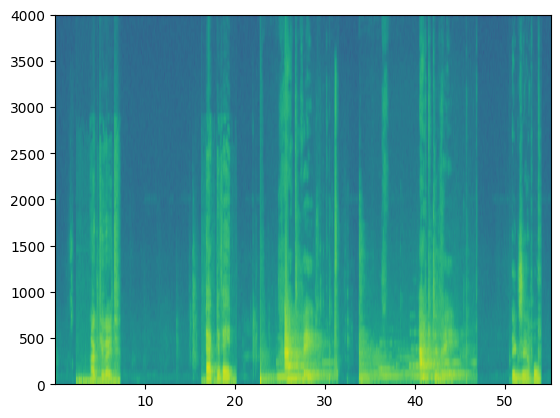

In [16]:
# Quick test
x, y = create_training_example(backgrounds[0], activates, negatives, Ty)

Now you can listen to the training example you created and compare it to the spectrogram generated above.

In [17]:
IPython.display.Audio("exported_audio/train.wav")

Finally, you can plot the associated labels for the generated training example.

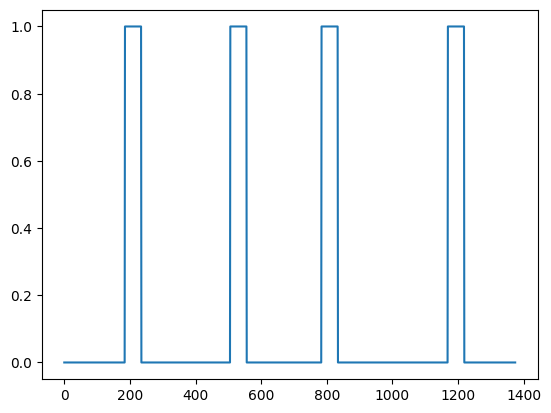

In [18]:
plt.plot(y[0])

### Full Training Set

* We've now implemented the code needed to generate a single training example.  
* Now, we generate a smaller training set of 32 examples. 

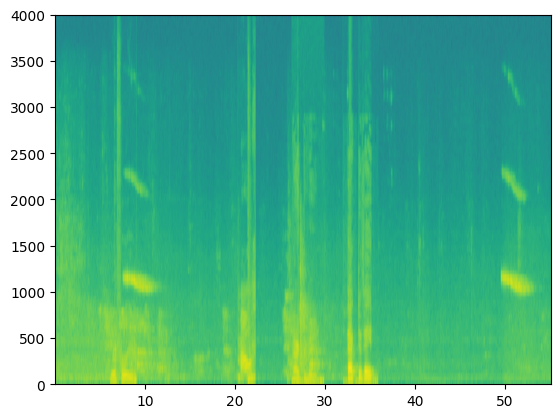

In [19]:
nsamples = 32
X = []
Y = []
for i in range(0, nsamples):
    # backgrounds[i%2] because we only have 2 background recording in 'raw_data'
    x, y = create_training_example(backgrounds[i % 2], activates, negatives, Ty)
    X.append(x.swapaxes(0,1))
    Y.append(y.swapaxes(0,1))
X = np.array(X)
Y = np.array(Y)

A few code blocks in case we want to save and load our created training set for future uses.

In [20]:
# Save the data for further uses
np.save(f'./XY_train/X.npy', X)
np.save(f'./XY_train/Y.npy', Y)

In [21]:
# Load the preprocessed training examples
X = np.load("./XY_train/X.npy")
Y = np.load("./XY_train/Y.npy")

### Development Set

* We want to create a development set using the same distribution as the real inputs. 
* To test our model, I downloaded a data set set of 25 real examples. 


In [22]:
# Load preprocessed dev set examples
X_dev = np.load("./XY_dev/X_dev.npy")
Y_dev = np.load("./XY_dev/Y_dev.npy")

## The Model
* Remember our spectogram created an image with 5511 time segments, but the expected input of the model is 1375.
    * The model will use 1-D convolutional layer to filter down from 5511 to 1375.
* We us GRU, BatchNorm, Dropout & Sigmoid activation on the last step.

In [23]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Activation, Dropout, Input, TimeDistributed, Conv1D
from tensorflow.keras.layers import GRU, BatchNormalization
from tensorflow.keras.optimizers import Adam

In [24]:
def modelf(input_shape):
    X_input = Input(shape = input_shape)

    X = Conv1D(filters=196, kernel_size=15, strides=4)(X_input)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
    X = Dropout(rate=0.8)(X)     

    X = GRU(128, return_sequences=True)(X)
    X = Dropout(rate=0.8)(X)
    X = BatchNormalization()(X)                           
    
    X = GRU(128, return_sequences=True)(X)
    X = Dropout(rate=0.8)(X)      
    X = BatchNormalization()(X) 
    X = Dropout(rate=0.8)(X)                                 
    
    X = TimeDistributed(Dense(1, activation='sigmoid'))(X)

    model = Model(inputs = X_input, outputs = X)
    
    return model  

In [25]:
model = modelf(input_shape = (Tx, n_freq))

Let's print the model summary to keep track of the shapes.

In [26]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 5511, 101)]       0         
                                                                 
 conv1d (Conv1D)             (None, 1375, 196)         297136    
                                                                 
 batch_normalization (BatchN  (None, 1375, 196)        784       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 1375, 196)         0         
                                                                 
 dropout (Dropout)           (None, 1375, 196)         0         
                                                                 
 gru (GRU)                   (None, 1375, 128)         125184    
                                                             

### Fit the Model

* Trigger word detection takes a long time to train. 
* We've already trained a model and saved it for easier access and use.

In [27]:
from tensorflow.keras.models import model_from_json

json_file = open('./models/model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)
model.load_weights('./models/model.h5')

In [28]:
model.layers[2].trainable = False
model.layers[7].trainable = False
model.layers[10].trainable = False

We can train the model further, using the training sets we created.

In [33]:
opt = Adam(learning_rate=1e-6, beta_1=0.9, beta_2=0.999)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["accuracy"])

In [34]:
model.fit(X, Y, batch_size = 16, epochs=1)

2/2 [==============================] - 8s 2s/step - loss: 0.1835 - accuracy: 0.9458


### Test the Model

Let's see how your model performs on the dev set.

In [35]:
loss, acc, = model.evaluate(X_dev, Y_dev)
print("Dev set accuracy = ", acc)

1/1 [==============================] - 2s 2s/step - loss: 0.1886 - accuracy: 0.9240
Dev set accuracy =  0.923985481262207


## Making Predictions

Now that you have built a working model for trigger word detection, let's use it to make predictions.


In [36]:
def detect_triggerword(filename):
    plt.subplot(2, 1, 1)
    
    # Correct the amplitude of the input file before prediction 
    audio_clip = AudioSegment.from_wav(filename)
    audio_clip = match_target_amplitude(audio_clip, -20.0)
    file_handle = audio_clip.export("exported_audio/tmp.wav", format="wav")
    filename = "exported_audio/tmp.wav"

    x = graph_spectrogram(filename)
    # the spectrogram outputs (freqs, Tx) and we want (Tx, freqs) to input into the model
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    
    plt.subplot(2, 1, 2)
    plt.plot(predictions[0,:,0])
    plt.ylabel('probability')
    plt.show()
    return predictions

### Inserting a "chime" sound whenever the keyword is detected.

* We will be using a buffer of 75, to make sure we don't add a "chime" sound twice for the same keyword.
* The code follows the following logic: 
    * We keep incrementing consecutive_timesteps unless we find a prediction that's lower than the threshold.
    In that case we reset everything back to 0.
    * If we find 20 consecutive timesteps where the prediction is higher than the threshold, we can add a "chime" sound and jump 75 time steps.

In [37]:
chime_file = "audio_examples/chime.wav"
def chime_on_activate(filename, predictions, threshold):
    audio_clip = AudioSegment.from_wav(filename)
    chime = AudioSegment.from_wav(chime_file)
    Ty = predictions.shape[1]
    consecutive_timesteps = 0
    i = 0
    while i < Ty:
        consecutive_timesteps += 1
        if consecutive_timesteps > 20:
            audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds) * 1000)
            consecutive_timesteps = 0
            i = 75 * (i // 75 + 1)
            continue
        if predictions[0, i, 0] < threshold:
            consecutive_timesteps = 0
        i += 1
        
    audio_clip.export("exported_audio/chime_output.wav", format='wav')

### Test on Dev Examples

In [38]:
IPython.display.Audio("./raw_data/dev/1.wav")

Now lets run the model on these audio clips and see if it adds a chime after "activate"!

1/1 [==============================] - 1s 1s/step


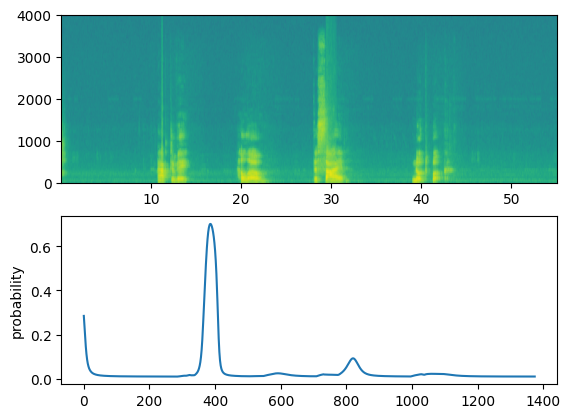

In [39]:
filename = "./raw_data/dev/1.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("./exported_audio/chime_output.wav")

### Final

That's the end of this project! <br>